In [1]:
import sys
sys.path.append('../')

import torch
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from functools import partial

import matplotlib.pyplot as plt
import numpy as np

from src.models.net import *
from src.si import *
from src.util import util as ut
device = torch.device('cuda:1' if torch.cuda.is_available() else 'cpu')

# the original interpolant was trained with mnist at time zero and svhn at time one
nsamples = 3000
testloader = ut.get_testloader_celeba_cartoon()


model = UNet(
    dim = 64,
    dim_mults = (1,2,4,),
    flash_attn = True,
    channels=1,
    resnet_block_groups=4,
    attn_dim_head=32,
    attn_heads=4,
).to(device)

model.load_state_dict(torch.load(f'../models/celeba_model_lin_ot/epoch_500.pt'))

model = ut.model_counter(model)
model.eval()


mcounts_celeba =[]
mcounts_cartoon = []



/home/gmiglior/.conda/envs/stochint/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Files already downloaded and verified


/home/gmiglior/cs274e/cs274e/gen_samples_ot/../src/util/util.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  labels[filename].append(row[1]==14)
/home/gmiglior/cs274e/cs274e/gen_samples_ot/../src/util/util.py:34: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  labels[filename].append(row[1]==11)
/home/gmiglior/cs274e/cs274e/gen_samples_ot/../src/util/util.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  labels[filename].appen

Datasets loaded
Non-A100 GPU detected, using math or mem efficient attention if input tensor is on cuda


In [2]:
next(iter(testloader))

[tensor([[[[0.1756, 0.2019, 0.2227,  ..., 0.3079, 0.3130, 0.3234],
           [0.1655, 0.1878, 0.2125,  ..., 0.3185, 0.3106, 0.3035],
           [0.1843, 0.1933, 0.2235,  ..., 0.3379, 0.3339, 0.3362],
           ...,
           [0.7479, 0.7346, 0.6942,  ..., 0.0775, 0.0431, 0.2534],
           [0.6714, 0.6472, 0.6593,  ..., 0.0723, 0.0344, 0.2438],
           [0.5799, 0.6099, 0.5325,  ..., 0.0633, 0.0224, 0.1593]]],
 
 
         [[[0.6110, 0.5593, 0.4772,  ..., 0.2459, 0.2308, 0.2178],
           [0.7606, 0.7325, 0.6849,  ..., 0.2466, 0.2331, 0.2171],
           [0.8309, 0.8244, 0.8218,  ..., 0.2433, 0.2336, 0.2179],
           ...,
           [0.0509, 0.0212, 0.1104,  ..., 0.1796, 0.1677, 0.1121],
           [0.0411, 0.0250, 0.1257,  ..., 0.1514, 0.1673, 0.1422],
           [0.0380, 0.0279, 0.1446,  ..., 0.1432, 0.1449, 0.1323]]],
 
 
         [[[0.3901, 0.4461, 0.6328,  ..., 0.6720, 0.6697, 0.6606],
           [0.5607, 0.6075, 0.6635,  ..., 0.6669, 0.6697, 0.6623],
           [0.6830

In [6]:
with torch.no_grad():
    si = LinearInterpolant(model, device=device)
    si.loss_type = 'velocity'
    si = make_sinsq_noisy(si)
    
    i=0
    j=0
    for b, (celeba_batch, cartoon_batch) in enumerate(testloader):
        gen_cartoon_samples = si.sample(x_initial=celeba_batch, direction='f')
        print('cartoon samples generated')
        print(f'NFE for cartoon:', model.counter)
        # convert tensors to images
        gen_cartoon_samples = gen_cartoon_samples.cpu().squeeze().detach().numpy()
        # save images
        for sample in gen_cartoon_samples:
            plt.imsave(f'../gen_samples_ot/cartoon/{i}.png', sample, cmap='gray')
            i+=1
        mcounts_cartoon.append(model.counter)
        
        model.counter = 0
        gen_celeba_samples = si.sample(x_initial=cartoon_batch, direction='r')
        print('celeba samples generated')
        print(f'NFE for celeba:', model.counter)
        # convert tensors to images
        gen_celeba_samples = gen_celeba_samples.cpu().squeeze().detach().numpy()
        # save images
        for sample in gen_celeba_samples:
            plt.imsave(f'../gen_samples_ot/celeba/{j}.png', sample, cmap='gray')
            j+=1
        mcounts_celeba.append(model.counter)
        model.counter = 0
mean_mcounts_celeba = np.mean(mcounts_celeba)
mean_mcounts_cartoon = np.mean(mcounts_cartoon)
print(f'Mean NFE for celeba: {mean_mcounts_celeba}')
print(f'Mean NFE for cartoon: {mean_mcounts_cartoon}')


cartoon samples generated
NFE for cartoon: 206
celeba samples generated
NFE for celeba: 152


KeyboardInterrupt: 

In [42]:

# x_initial = next(iter(combined_dataloader))[0][:10].to(device)
with torch.no_grad():
    x_initial = next(iter(testloader))[0][:10].to(device)

    n_eval = 11
    n_samples = 10
    # x_initial = torch.randn(n_samples, 1, 28, 28)

    t = torch.linspace(0,1., n_eval)
    inital_batch_size = x_initial.shape[0]

    if n_samples > inital_batch_size:
        # if x_initial has less samples than n_samples, repeat x_initial at random to get n_samples
        n_new_samples = n_samples - inital_batch_size
        x_initial = torch.cat([x_initial, x_initial[torch.randint(0, inital_batch_size, (n_new_samples,))]], dim=0)
    if n_samples < inital_batch_size:
        # if x_initial has more samples than n_samples, randomly choose n_samples samples from x_initial
        x_initial = x_initial[torch.randperm(inital_batch_size)[:n_samples]]


    method = 'dopri5'
    rtol = 1e-4
    atol = 1e-4
    out = odeint(model, x_initial, t, method=method, rtol=rtol, atol=atol)




/home/gmiglior/.conda/envs/stochint/lib/python3.10/site-packages/torchdiffeq/_impl/misc.py:296: UserWarning: t is not on the same device as y0. Coercing to y0.device.
  warnings.warn("t is not on the same device as y0. Coercing to y0.device.")


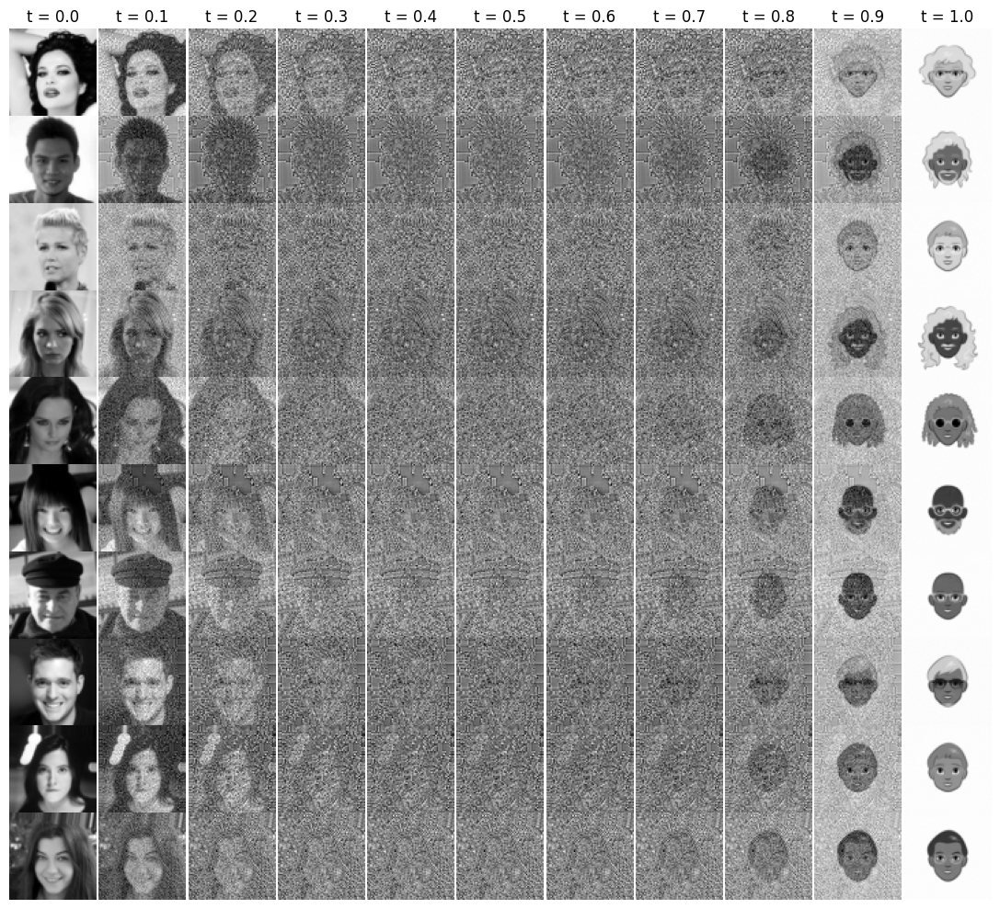

In [43]:
# show the image
fig, axs = plt.subplots(n_samples, n_eval, figsize=(n_eval, n_samples))

for i in range(n_samples):
    # set title for each column
    for j in range(n_eval):
        axs[0,j].set_title(f't = {j*(0.1):.1f}')
        axs[i, j].imshow(out[j][i].squeeze().detach().cpu().numpy(), cmap='gray')
        axs[i, j].axis('off')
plt.tight_layout()
# reduce space between subplots
plt.subplots_adjust(wspace=0, hspace=0)
# save figure in pdf
plt.savefig(f'../figures/celeba_cartoon.pdf')
plt.show()

In [39]:

# x_initial = next(iter(combined_dataloader))[0][:10].to(device)
with torch.no_grad():
    x_initial = next(iter(testloader))[1][:10].to(device)

    n_eval = 11
    n_samples = 10
    # x_initial = torch.randn(n_samples, 1, 28, 28)

    t = torch.linspace(1.,0., n_eval)
    inital_batch_size = x_initial.shape[0]

    if n_samples > inital_batch_size:
        # if x_initial has less samples than n_samples, repeat x_initial at random to get n_samples
        n_new_samples = n_samples - inital_batch_size
        x_initial = torch.cat([x_initial, x_initial[torch.randint(0, inital_batch_size, (n_new_samples,))]], dim=0)
    if n_samples < inital_batch_size:
        # if x_initial has more samples than n_samples, randomly choose n_samples samples from x_initial
        x_initial = x_initial[torch.randperm(inital_batch_size)[:n_samples]]


    method = 'dopri5'
    rtol = 1e-4
    atol = 1e-4
    out = odeint(model, x_initial, t, method=method, rtol=rtol, atol=atol)



/home/gmiglior/.conda/envs/stochint/lib/python3.10/site-packages/torchdiffeq/_impl/misc.py:296: UserWarning: t is not on the same device as y0. Coercing to y0.device.
  warnings.warn("t is not on the same device as y0. Coercing to y0.device.")


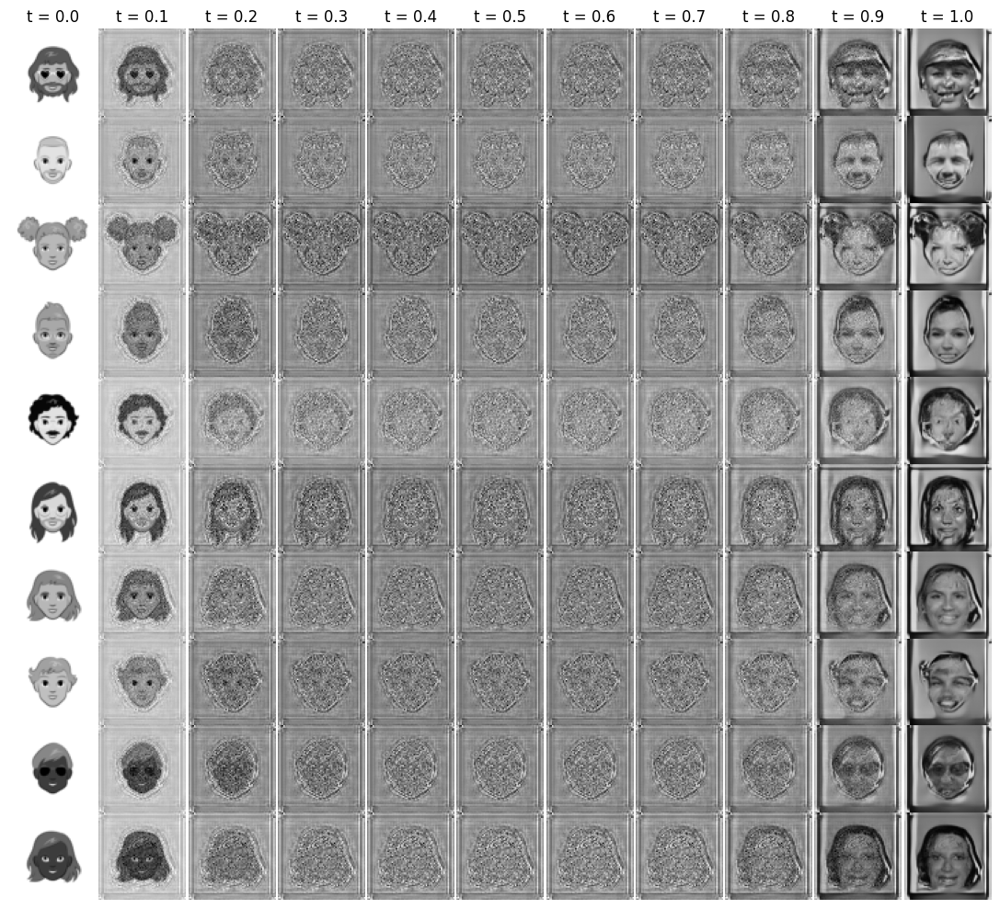

In [40]:
# show the image
fig, axs = plt.subplots(n_samples, n_eval, figsize=(n_eval, n_samples))

for i in range(n_samples):
    # set title for each column
    for j in range(n_eval):
        axs[0,j].set_title(f't = {j*(0.1):.1f}')
        axs[i, j].imshow(out[j][i].squeeze().detach().cpu().numpy(), cmap='gray')
        axs[i, j].axis('off')
plt.tight_layout()

# reduce space between subplots
plt.subplots_adjust(wspace=0, hspace=0)
# save figure in pdf
plt.savefig(f'../figures/cartoon_celeba.png')
# plt.tight_layout()
plt.show()

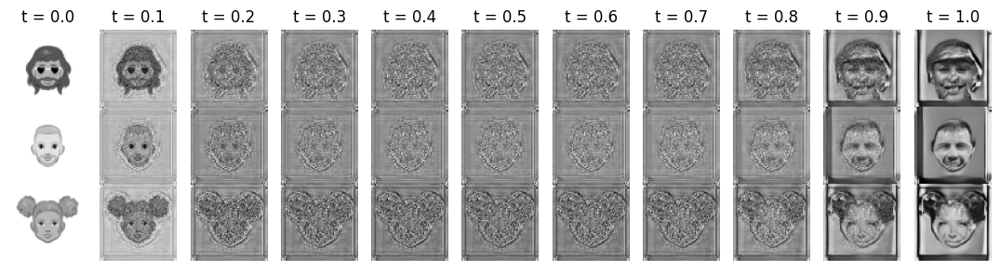

In [41]:
# show the image
fig, axs = plt.subplots(3, n_eval, figsize=(n_eval, 3))

for i in range(3):
    # set title for each column
    for j in range(n_eval):
        axs[0,j].set_title(f't = {j*(0.1):.1f}')
        axs[i, j].imshow(out[j][i].squeeze().detach().cpu().numpy(), cmap='gray')
        axs[i, j].axis('off')
plt.tight_layout()

# reduce space between subplots
plt.subplots_adjust(wspace=0, hspace=0)
# reduce space around the figure

# save figure in pdf
plt.savefig(f'../figures/cartoon_celeba_main.pdf')
plt.show()

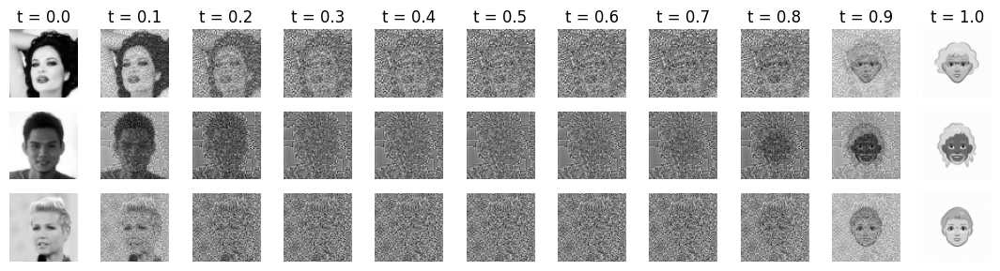

In [44]:
# show the image
fig, axs = plt.subplots(3, n_eval, figsize=(n_eval, 3))

for i in range(3):
    # set title for each column
    for j in range(n_eval):
        axs[0,j].set_title(f't = {j*(0.1):.1f}')
        axs[i, j].imshow(out[j][i].squeeze().detach().cpu().numpy(), cmap='gray')
        axs[i, j].axis('off')
plt.tight_layout()

# reduce space between subplots
plt.subplots_adjust(wspace=0, hspace=0)
# save figure in pdf
plt.savefig(f'../figures/celeba_cartoon_main.pdf')
plt.tight_layout()
plt.show()